In [1]:
%%capture
!unzip /content/drive/MyDrive/celeba/img_align_celeba.zip

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils as vutils
from PIL import Image
import matplotlib.pyplot as plt

In [3]:
IMAGE_SIZE = 128
LATENT_DIM = 512 * 2 * 2  #latent space dimension based on a 512-channel feature map with spatial dimensions 2x2.
BATCH_SIZE = 128
EPOCHS = 50
DATA_DIR = '/content/img_align_celeba'

img_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
])

In [4]:
class CelebDataset(Dataset):
    def __init__(self, root_dir, transform=None, max_images=10000):
        self.root_dir = root_dir
        self.transform = transform
        self.files = sorted([
            os.path.join(root_dir, fname)
            for fname in os.listdir(root_dir)
            if fname.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        if max_images is not None:
            self.files = self.files[:max_images]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

def get_data_loader(data_dir, batch_size=BATCH_SIZE, max_images=5000):
    dataset = CelebDataset(root_dir=data_dir, transform=img_transforms, max_images=max_images)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    return loader

In [5]:
"""implementing a simplified VGG19 network used for computing
the perceptual (feature) loss between the original and reconstructed images. The network
loads pretrained weights and compares feature maps from various layers. It will
help the VAE generate reconstructions with improved visual quality."""
class VGG19(nn.Module):

    def __init__(self, channel_in=3, width=64):
        super(VGG19, self).__init__()
        self.conv1 = nn.Conv2d(channel_in, width, 3, 1, 1)
        self.conv2 = nn.Conv2d(width, width, 3, 1, 1)
        self.conv3 = nn.Conv2d(width, 2 * width, 3, 1, 1)
        self.conv4 = nn.Conv2d(2 * width, 2 * width, 3, 1, 1)
        self.conv5 = nn.Conv2d(2 * width, 4 * width, 3, 1, 1)
        self.conv6 = nn.Conv2d(4 * width, 4 * width, 3, 1, 1)
        self.conv7 = nn.Conv2d(4 * width, 4 * width, 3, 1, 1)
        self.conv8 = nn.Conv2d(4 * width, 4 * width, 3, 1, 1)
        self.conv9 = nn.Conv2d(4 * width, 8 * width, 3, 1, 1)
        self.conv10 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv11 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv12 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv13 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv14 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv15 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.conv16 = nn.Conv2d(8 * width, 8 * width, 3, 1, 1)
        self.mp = nn.MaxPool2d(kernel_size=2, stride=2)
        self.relu = nn.ReLU()
        self.load_params_()




    """downloading the pretrained VGG19 weights and mapping them sequentially
to the defined layers. The weights are then frozen (requires_grad=False) to
ensure they are not updated during training."""
    def load_params_(self):
        state_dict = torch.hub.load_state_dict_from_url(
            'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth', progress=True
        )
        params = list(self.parameters())
        for key, param in state_dict.items():
            if params:
                target_param = params.pop(0)
                if target_param.shape == param.shape:
                    target_param.data.copy_(param.data)
                    target_param.requires_grad = False

    def feature_loss(self, x):
        """feature_loss will split the input batch in half and compute the mean squared
        error between the corresponding feature maps of the two halves. The first half
        represents the target features while the second half represents the reconstructed
        features."""
        half = x.shape[0] // 2
        return (x[:half] - x[half:]).pow(2).mean()

    def forward(self, x):
        """The forward method will pass the concatenated input (target and reconstruction)
        through all layers of VGG19, accumulating the feature loss from each layer.
        The final loss is the average over all 16 layers."""
        loss = 0
        x = self.conv1(x)
        loss += self.feature_loss(x)
        x = self.conv2(self.relu(x))
        loss += self.feature_loss(x)
        x = self.mp(self.relu(x))
        x = self.conv3(x)
        loss += self.feature_loss(x)
        x = self.conv4(self.relu(x))
        loss += self.feature_loss(x)
        x = self.mp(self.relu(x))
        x = self.conv5(x)
        loss += self.feature_loss(x)
        x = self.conv6(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv7(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv8(self.relu(x))
        loss += self.feature_loss(x)
        x = self.mp(self.relu(x))
        x = self.conv9(x)
        loss += self.feature_loss(x)
        x = self.conv10(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv11(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv12(self.relu(x))
        loss += self.feature_loss(x)
        x = self.mp(self.relu(x))
        x = self.conv13(x)
        loss += self.feature_loss(x)
        x = self.conv14(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv15(self.relu(x))
        loss += self.feature_loss(x)
        x = self.conv16(self.relu(x))
        loss += self.feature_loss(x)
        return loss / 16

In [6]:
"""Creating the Variational Autoencoder (VAE) architecture with skip connections,
inspired by U-Net. The encoder downsamples the input image to a latent space (with a shape
512x2x2) while storing intermediate feature maps for skip connections.
The decoder upsamples the latent representation and merges it with encoder features to
preserve fine details. This will help in reconstruction quality."""

class SkipConvVAE(nn.Module):
    def __init__(self, image_size=IMAGE_SIZE, latent_dim=LATENT_DIM, in_channels=3):
        super(SkipConvVAE, self).__init__()

        self.encoder_blocks = nn.ModuleList()
        enc_channels = [32, 64, 128, 256, 512, 512]
        current_channels = in_channels
        for h_dim in enc_channels:
            block = nn.Sequential(
                nn.Conv2d(current_channels, h_dim, kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(h_dim),
                nn.LeakyReLU(inplace=True)
            )
            self.encoder_blocks.append(block)
            current_channels = h_dim
        self.enc_out_channels = current_channels  # 512 from last block
        self.enc_spatial_dim = image_size // (2 ** len(enc_channels))  # 128 / 64 = 2
        self.enc_out_dim = self.enc_out_channels * (self.enc_spatial_dim ** 2)  # 512*4 = 2048

        self.fc_mu = nn.Linear(self.enc_out_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.enc_out_dim, latent_dim)

        self.upconv1 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv1_fuse = nn.Sequential(
            nn.Conv2d(512 + 512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(inplace=True)
        )

        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv2_fuse = nn.Sequential(
            nn.Conv2d(256 + 256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(inplace=True)
        )

        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv3_fuse = nn.Sequential(
            nn.Conv2d(128 + 128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True)
        )

        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv4_fuse = nn.Sequential(
            nn.Conv2d(64 + 64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(inplace=True)
        )

        self.upconv5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.conv5_fuse = nn.Sequential(
            nn.Conv2d(32 + 32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(inplace=True)
        )

        self.final_upconv = nn.ConvTranspose2d(32, in_channels, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.final_activation = nn.Sigmoid()

    def encode(self, x):
        skip_features = []
        out = x
        for block in self.encoder_blocks:
            out = block(out)
            skip_features.append(out)
        out_flat = out.view(out.size(0), -1)
        mu = self.fc_mu(out_flat)
        logvar = self.fc_logvar(out_flat)
        return mu, logvar, skip_features

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, skip_features):
        batch_size = z.size(0)
        x = z.view(batch_size, 512, self.enc_spatial_dim, self.enc_spatial_dim)

        skip5 = skip_features[-2]
        x = self.upconv1(x)
        x = torch.cat([x, skip5], dim=1)
        x = self.conv1_fuse(x)

        skip4 = skip_features[-3]
        x = self.upconv2(x)
        x = torch.cat([x, skip4], dim=1)
        x = self.conv2_fuse(x)

        skip3 = skip_features[-4]
        x = self.upconv3(x)
        x = torch.cat([x, skip3], dim=1)
        x = self.conv3_fuse(x)

        skip2 = skip_features[-5]
        x = self.upconv4(x)
        x = torch.cat([x, skip2], dim=1)
        x = self.conv4_fuse(x)

        skip1 = skip_features[-6]
        x = self.upconv5(x)
        x = torch.cat([x, skip1], dim=1)
        x = self.conv5_fuse(x)
        x = self.final_upconv(x)
        x = self.final_activation(x)
        return x

    def forward(self, x):
        mu, logvar, skip_features = self.encode(x)
        z = self.reparameterize(mu, logvar)
        reconstruction = self.decode(z, skip_features)
        return reconstruction, mu, logvar

In [7]:
"""loss function for the VAE. It calculates:
Reconstruction loss (binary cross-entropy with mean reduction) for pixel-wise accuracy.
KL divergence loss to regularize the latent space.
Perceptual loss computed from the VGG19 module to improve visual clarity.
An annealing factor is applied to the KL term over training epochs for improves convergence and training"""


def vae_loss(recon_x, x, mu, logvar, vgg, lambda_vgg=0.1, beta=1.0, epoch=None, total_epochs=None):

    recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction='mean')

    kld_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    if epoch is not None and total_epochs is not None:
        anneal_factor = min(1.0, epoch / total_epochs)
    else:
        anneal_factor = 1.0

    vgg_input = torch.cat([x, recon_x], dim=0)
    percept_loss = vgg(vgg_input)
    return recon_loss + (beta * anneal_factor) * kld_loss + lambda_vgg * percept_loss

In [8]:
# Function to train the network
def train_vae(model, dataloader, vgg, epochs=EPOCHS, lr=1e-3, lambda_vgg=0.1, beta=1.0):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model.train()
    vgg.eval()
    loss_history = []
    fixed_batch = next(iter(dataloader))[:16].to(device)

    for epoch in range(1, epochs + 1):
        total_loss = 0.0
        for batch in dataloader:
            batch = batch.to(device)
            optimizer.zero_grad()
            recon, mu, logvar = model(batch)
            loss = vae_loss(recon, batch, mu, logvar, vgg, lambda_vgg=lambda_vgg, beta=beta,
                            epoch=epoch, total_epochs=epochs)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(dataloader.dataset)
        loss_history.append(avg_loss)
        print(f"Epoch {epoch}/{epochs} - Average Loss: {avg_loss:.4f}")

        with torch.no_grad():
            recon_fixed, _, _ = model(fixed_batch)
            comp = torch.cat([fixed_batch, recon_fixed])
            grid = vutils.make_grid(comp.cpu(), nrow=16)
            plt.figure(figsize=(12, 6))
            plt.imshow(grid.permute(1, 2, 0))
            plt.title(f'Epoch {epoch} - Original vs Reconstruction')
            plt.axis('off')
            plt.show()

    plt.figure()
    plt.plot(range(1, epochs + 1), loss_history, marker='o')
    plt.xlabel('Epoch')
    plt.ylabel('Average Loss')
    plt.title('Training Loss Curve')
    plt.grid(True)
    plt.show()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 134MB/s]


Epoch 1/50 - Average Loss: 0.0083


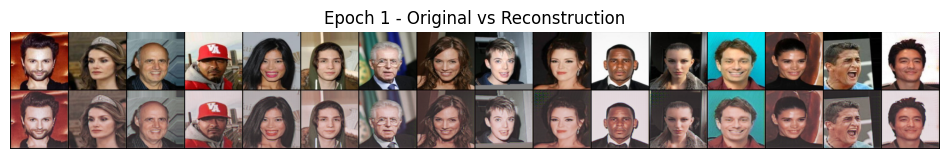

Epoch 2/50 - Average Loss: 0.0048


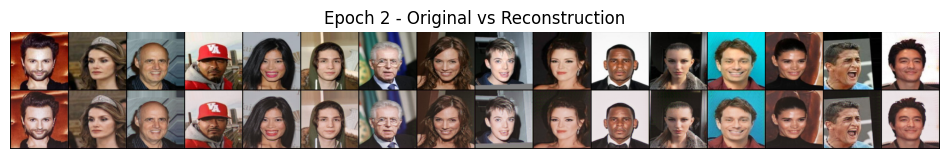

Epoch 3/50 - Average Loss: 0.0043


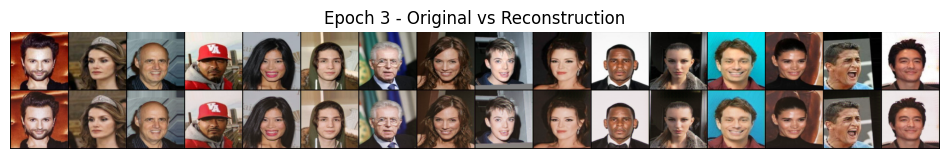

Epoch 4/50 - Average Loss: 0.0041


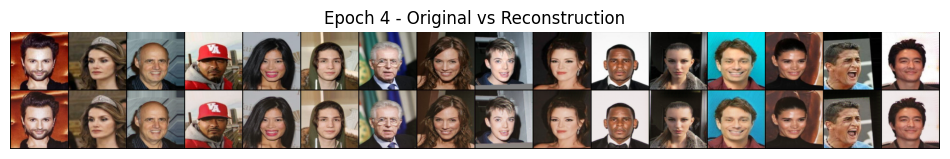

Epoch 5/50 - Average Loss: 0.0041


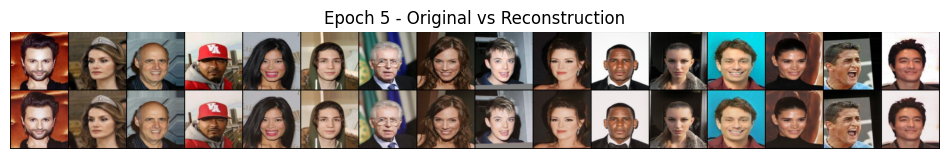

Epoch 6/50 - Average Loss: 0.0040


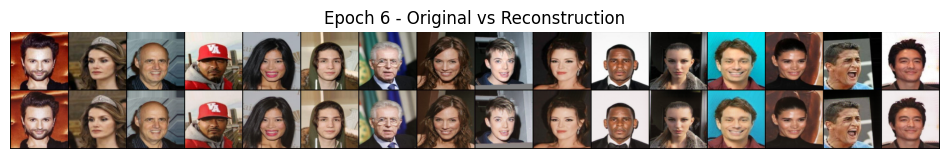

Epoch 7/50 - Average Loss: 0.0040


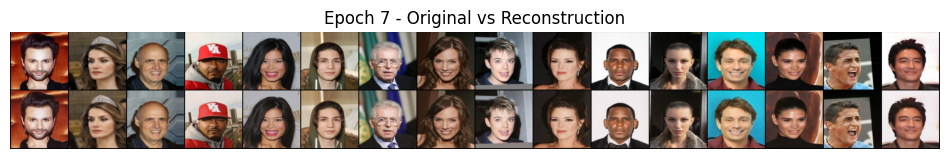

Epoch 8/50 - Average Loss: 0.0040


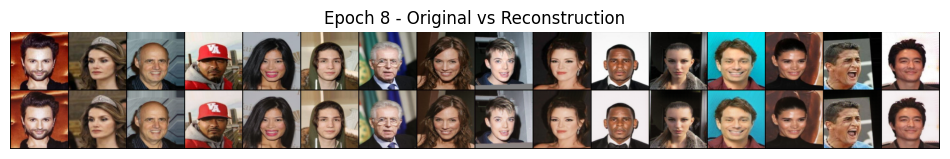

Epoch 9/50 - Average Loss: 0.0039


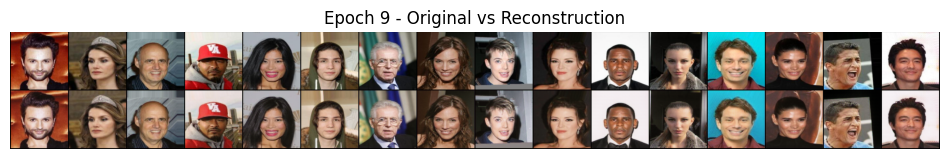

Epoch 10/50 - Average Loss: 0.0039


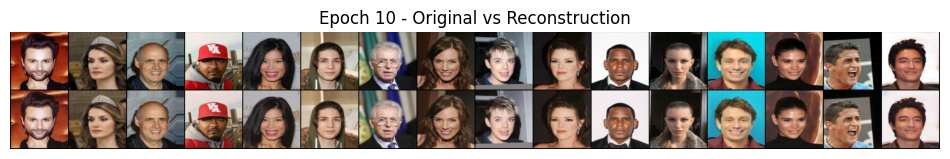

Epoch 11/50 - Average Loss: 0.0039


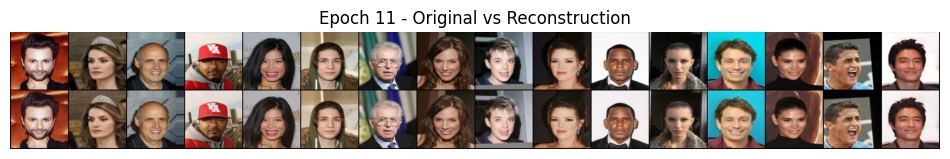

Epoch 12/50 - Average Loss: 0.0039


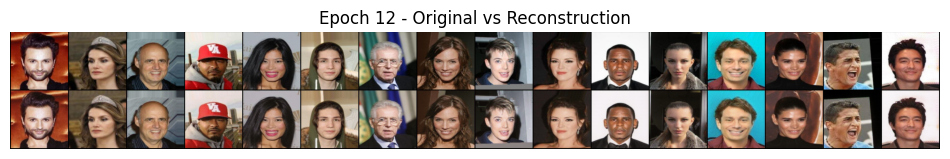

Epoch 13/50 - Average Loss: 0.0039


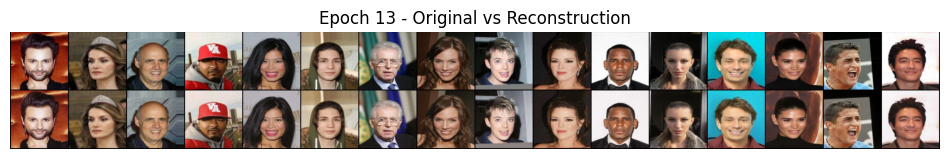

Epoch 14/50 - Average Loss: 0.0039


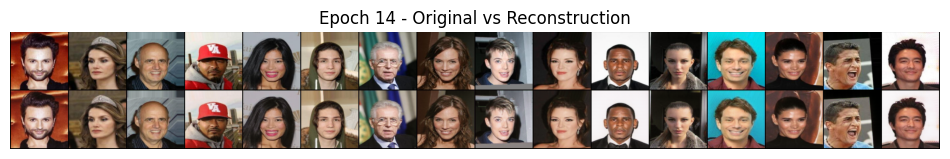

Epoch 15/50 - Average Loss: 0.0039


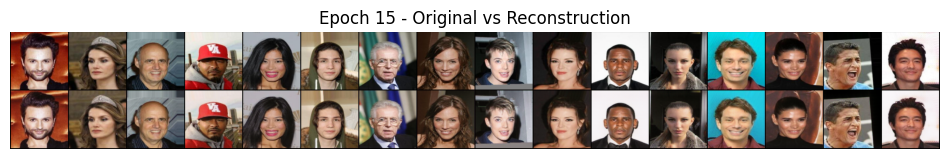

Epoch 16/50 - Average Loss: 0.0039


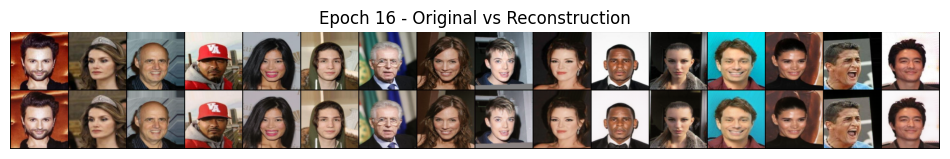

Epoch 17/50 - Average Loss: 0.0039


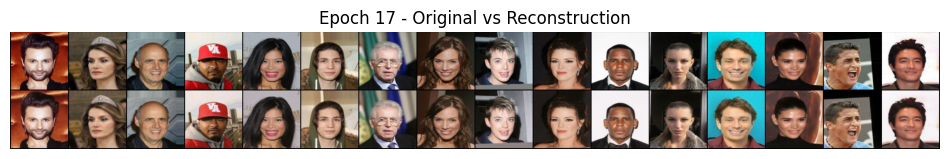

Epoch 18/50 - Average Loss: 0.0039


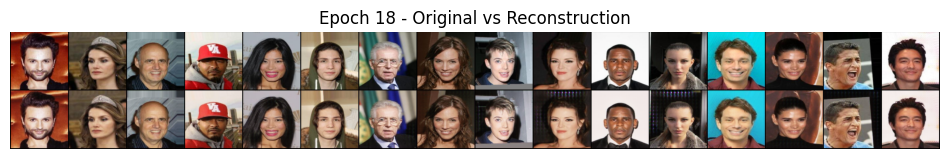

Epoch 19/50 - Average Loss: 0.0039


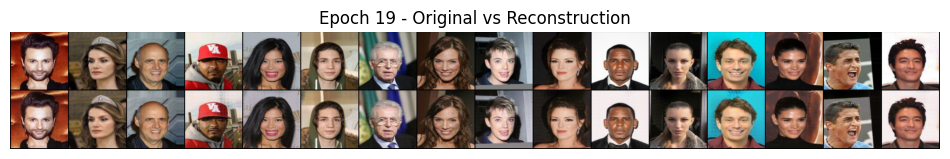

Epoch 20/50 - Average Loss: 0.0039


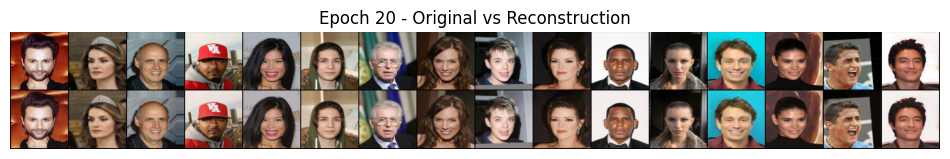

Epoch 21/50 - Average Loss: 0.0039


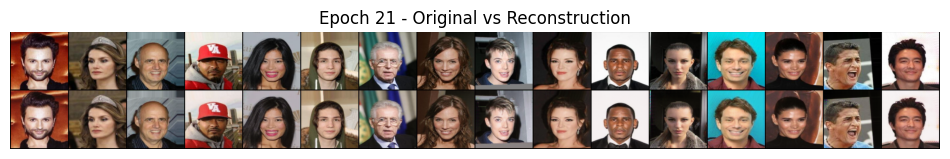

Epoch 22/50 - Average Loss: 0.0038


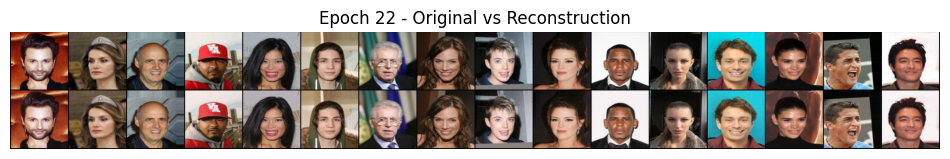

Epoch 23/50 - Average Loss: 0.0039


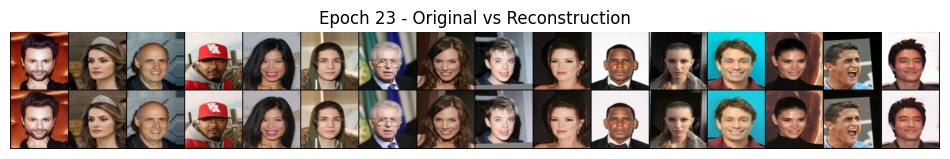

Epoch 24/50 - Average Loss: 0.0039


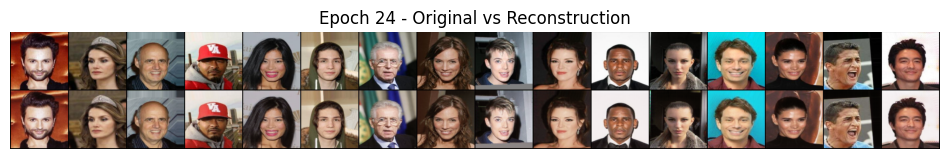

Epoch 25/50 - Average Loss: 0.0039


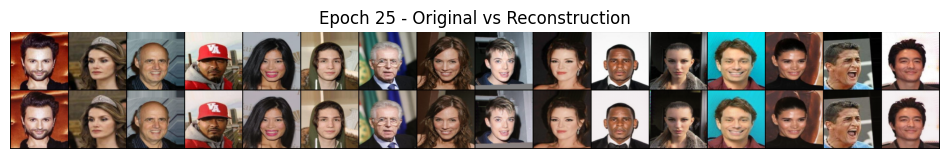

Epoch 26/50 - Average Loss: 0.0038


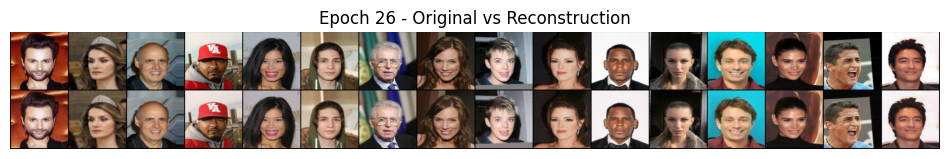

Epoch 27/50 - Average Loss: 0.0038


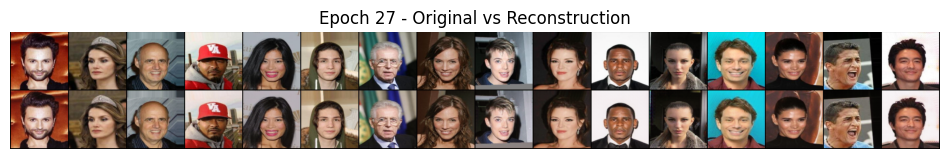

Epoch 28/50 - Average Loss: 0.0038


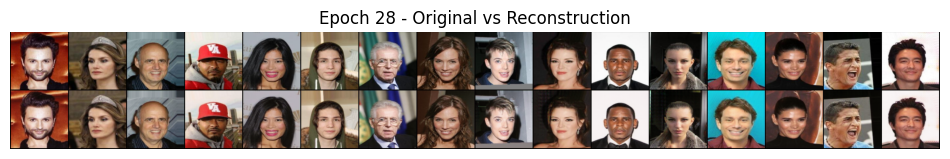

Epoch 29/50 - Average Loss: 0.0038


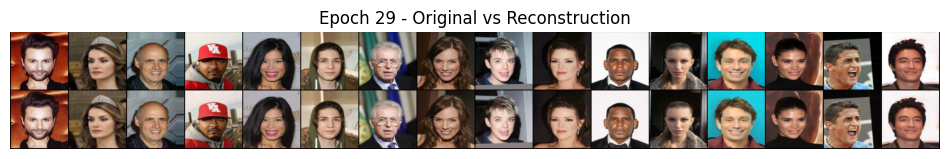

Epoch 30/50 - Average Loss: 0.0038


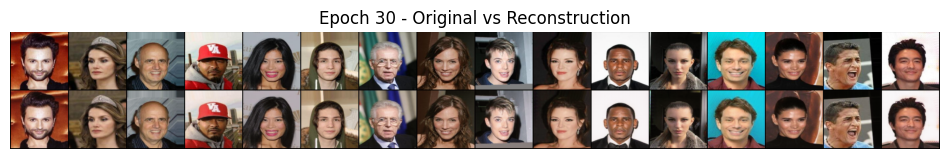

Epoch 31/50 - Average Loss: 0.0038


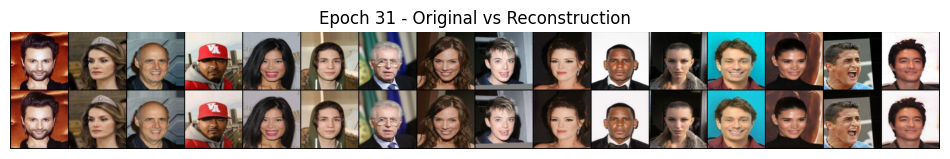

Epoch 32/50 - Average Loss: 0.0038


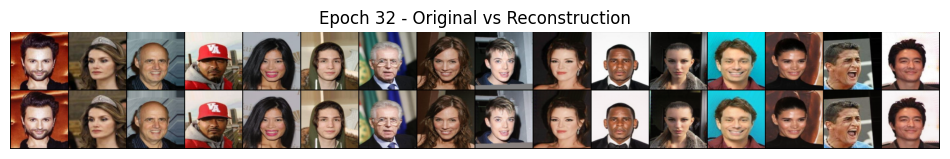

Epoch 33/50 - Average Loss: 0.0039


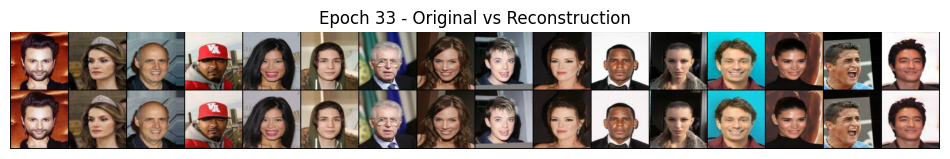

Epoch 34/50 - Average Loss: 0.0038


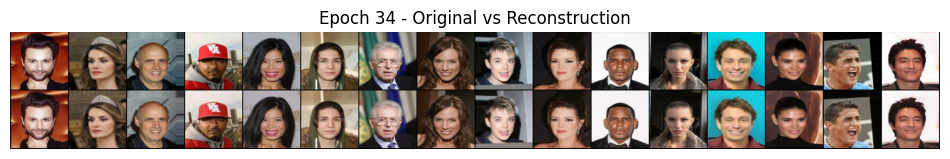

Epoch 35/50 - Average Loss: 0.0038


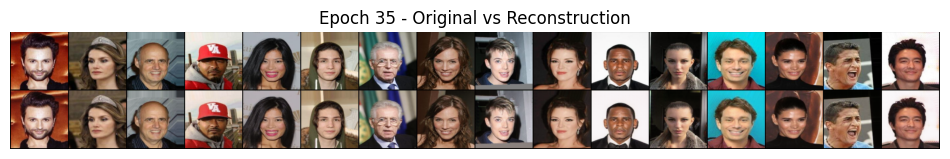

Epoch 36/50 - Average Loss: 0.0038


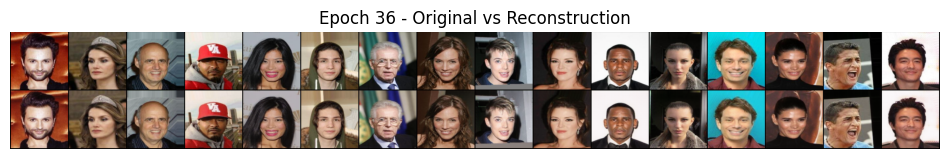

Epoch 37/50 - Average Loss: 0.0038


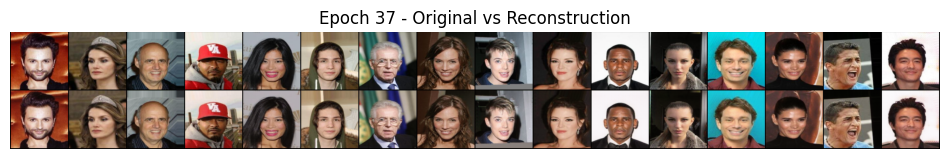

Epoch 38/50 - Average Loss: 0.0038


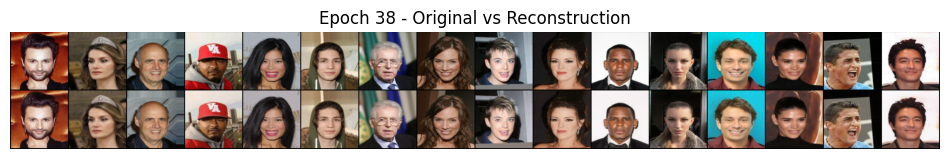

Epoch 39/50 - Average Loss: 0.0038


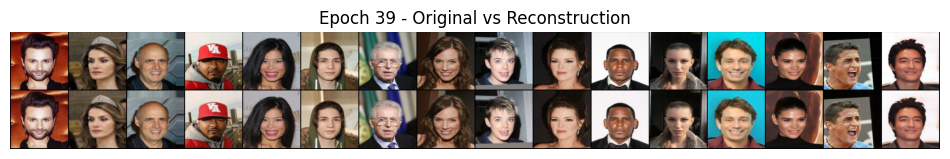

Epoch 40/50 - Average Loss: 0.0038


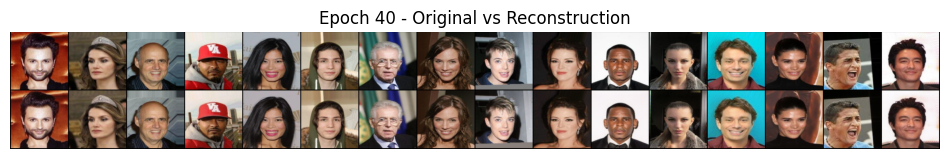

Epoch 41/50 - Average Loss: 0.0038


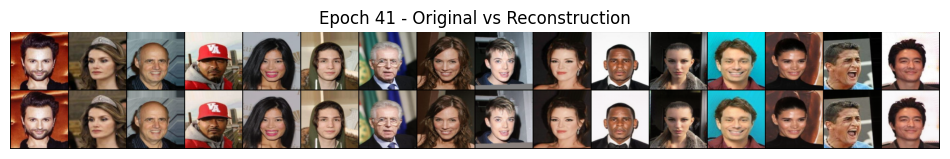

Epoch 42/50 - Average Loss: 0.0038


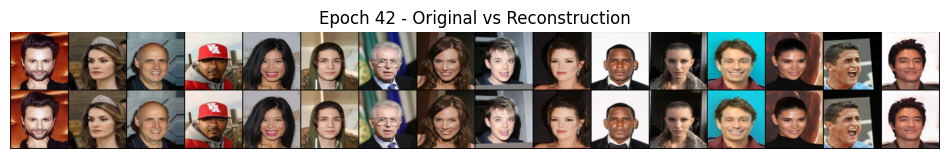

Epoch 43/50 - Average Loss: 0.0038


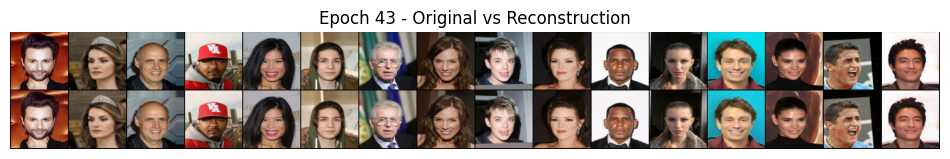

Epoch 44/50 - Average Loss: 0.0038


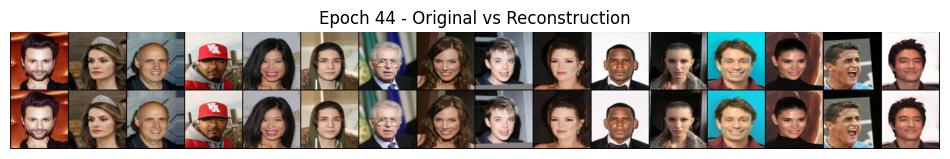

Epoch 45/50 - Average Loss: 0.0038


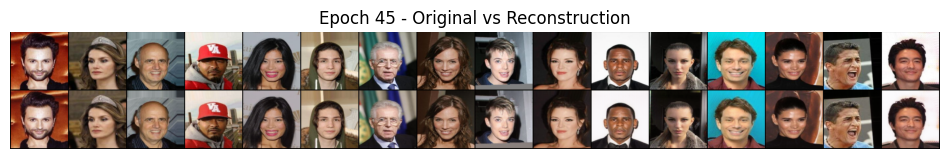

Epoch 46/50 - Average Loss: 0.0038


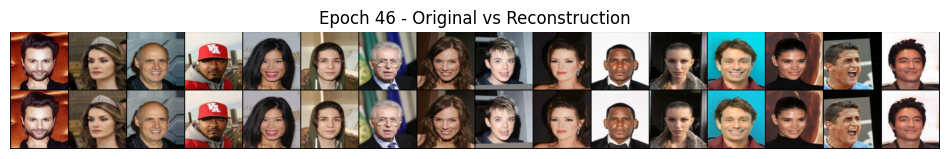

Epoch 47/50 - Average Loss: 0.0038


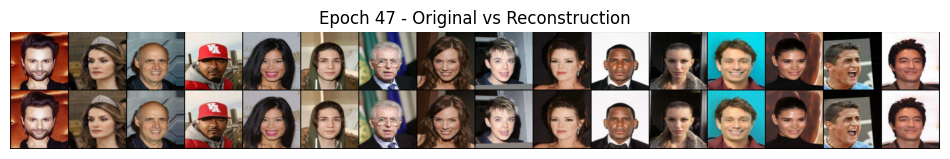

Epoch 48/50 - Average Loss: 0.0038


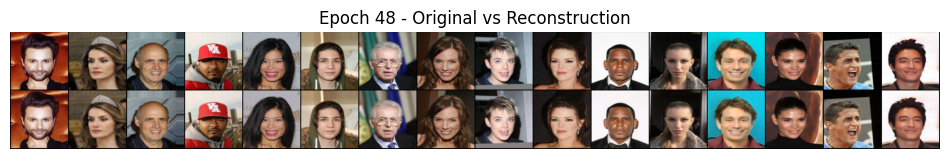

Epoch 49/50 - Average Loss: 0.0038


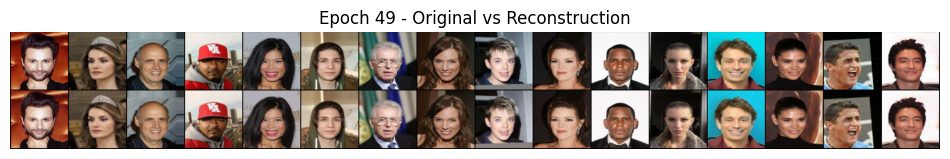

Epoch 50/50 - Average Loss: 0.0038


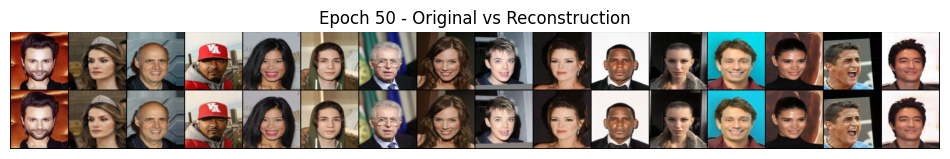

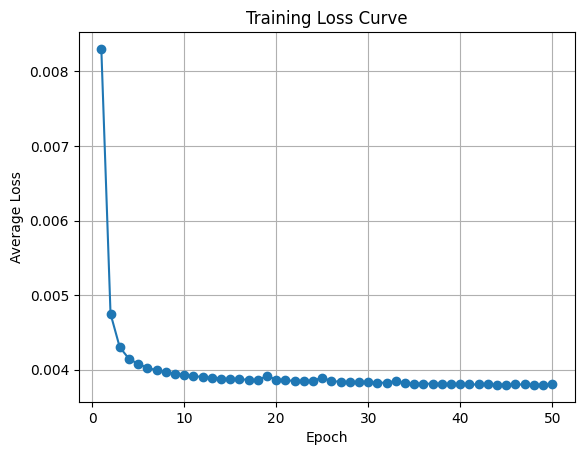

In [9]:
if __name__ == '__main__':
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    loader = get_data_loader(DATA_DIR, batch_size=BATCH_SIZE, max_images=10000)
    vae_model = SkipConvVAE(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM, in_channels=3).to(device)
    vgg_model = VGG19(channel_in=3, width=64).to(device)
    train_vae(vae_model, loader, vgg_model, epochs=EPOCHS, lr=1e-3, lambda_vgg=0.1, beta=1.0)

#Saving the model and testing it over a new image

In [10]:
torch.save(vae_model.state_dict(), 'skip_conv_vae.pth')
print("Model saved to skip_conv_vae.pth")

Model saved to skip_conv_vae.pth


In [11]:
loaded_model = SkipConvVAE(image_size=IMAGE_SIZE, latent_dim=LATENT_DIM, in_channels=3).to(device)
loaded_model.load_state_dict(torch.load('skip_conv_vae.pth', map_location=device))
loaded_model.eval()
print("Model loaded and set to evaluation mode.")

Model loaded and set to evaluation mode.


<ipython-input-11-b018abcbd4fa>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_model.load_state_dict(torch.load('skip_conv_vae.pth', map_location=device))


In [12]:
def reconstruct_image(image_path, model, device, transform):
    """
    Given an image file path, this function loads the image, applies the necessary
    transforms, runs the model to generate a reconstruction, and returns both
    the original and reconstructed images as tensors.
    """

    image = Image.open(image_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        reconstruction, _, _ = model(image_tensor)


    original_img = image_tensor.squeeze(0).cpu()
    recon_img = reconstruction.squeeze(0).cpu()
    return original_img, recon_img

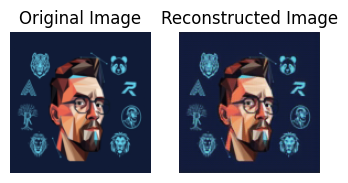

In [13]:
test_image_path = '/content/Test.jpg'


original_img, reconstructed_img = reconstruct_image(test_image_path, loaded_model, device, img_transforms)


fig, axes = plt.subplots(1, 2, figsize=(4, 2))
axes[0].imshow(original_img.permute(1, 2, 0))
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].imshow(reconstructed_img.permute(1, 2, 0))
axes[1].set_title("Reconstructed Image")
axes[1].axis("off")
plt.show()

#Key Findings
- If we use a pretrained model like VGG as a feature extractor to extract high level features then it can help with higher quality image reconstructions.
- We can freeze the weights of vgg19 and then compare its feature map for both original and reconstructed image to label it as perceptual loss.
- This might not affect simpler datasets like celeba much but can definitely help with high resolution complex images.
- For the VAE we can have a Unet like architecture with encoder and decoder with addition of latent space in between as is the case with original implementation.
- The unet with skip connections help preserve some finer details which might get lost in downsampling process. Using the skip connection this stored features can be directly fed to the decoder for efficient decoding and reconstrution.
- We will gradually anneal our KL divergence over training epoch so that the network initially focuses more on reconstruction and gradually tries to regularize the latent space.


# High level overall flow of the VAe
- Images are loaded, preprocessed, and batched for training via a custom dataset and DataLoader.
- The SkipConvVAE is made to capture both high-level semantics (downsampling and latent space representation) and low-level details (skip connections). This dual approach leads to high-quality reconstructions.
- By using a pretrained VGG19 network to compute perceptual loss, the model can maintain visual fidelity, resulting in reconstructions that are accurate at a pixel level but also has good perceptual quality.
- The model is trained using a composite loss function that balances reconstruction accuracy, latent space regularization, and perceptual quality. A training loop iterates through the dataset, optimizing the model while visualizing reconstruction progress.
- Once trained, the model is saved, loaded, and then used to reconstruct any new image using a dedicated inference pipeline. This allows you to deploy the model easily for real-world applications or further experimentation.